# Lucien's Pokemon GAN

*Adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html*

Implemented model uses a single GPU and 80x80 training images.

In [202]:
import os
import random
import torch
import torch.nn as nn 
import numpy as np
import wandb
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image, ImageEnhance, ImageFilter

In [29]:
# Set seed
manualSeed = 112521
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [30]:
dataset_root = "./pokemon"
# workers for dataloader
workers = 0
# training image sizes, will be resized
image_size = 64
# number of color channels in the images
num_channels = 4 # with alpha
# size of latent vector z (input to gen)
z_size = 100
# size of the generator's feature maps
num_gen_features = 64
# size of the discriminator's feature maps
num_dis_features = 64
# hyperparam configuration
wandb.config = {
    "learning_rate": 2e-5, # LR for optimizers
    "batch_size": 32, # batch size for training
    "beta1": 0.5 # for Adam optimizer
}
config = wandb.config

### wandb Initialization

In [31]:
wandb.login() 
wandb_project = "poke-gan"
wandb_entity = "leckert"

## Loading Data

In [32]:
# Use a custom PIL loader to support alpha channel
def pil_loader_alpha(img_path):
    with open(img_path, "rb") as f:
        img = Image.open(f)
        return img.convert("RGBA")

In [33]:
dataset = dset.ImageFolder(root=dataset_root,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5, 0.5),
                                                    (0.5, 0.5, 0.5, 0.5))
                           ]),
                           # Support alpha channel
                           loader = pil_loader_alpha)

# Create a dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=config["batch_size"], 
                                         shuffle=True, 
                                         num_workers=workers)

In [34]:
# Choose device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch.cuda.get_device_name(0) if device != "cpu" else "CPU"

'GeForce MX130'

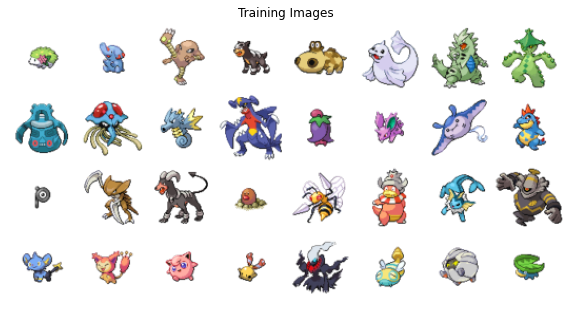

In [35]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], 
                                        padding=2, normalize=True).cpu(), 
                                        (1,2,0)))

## Weight Initialization

In [36]:
'''
    Randomly initialize weights, based on whether we're initializing
    the generator or discriminator.
    Adapted from the DCGAN tutorial from the PyTorch docs.
'''
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

## Generator

In [37]:
'''
    Generator network for use in the GAN. 
    Adapted from the DCGAN tutorial from the PyTorch docs.
'''
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.ngpu = 1 if device == "cuda:0" else 0
        self.main = nn.Sequential(
            # Input is Z
            nn.ConvTranspose2d(z_size, num_gen_features * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(num_gen_features * 8),
            nn.ReLU(True),
            # state: num_gen_features * 8 x 4 x 4
            nn.ConvTranspose2d(num_gen_features * 8, num_gen_features * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_gen_features * 4),
            nn.ReLU(True),
            # state: num_gen_features * 4 x 8 x 8
            nn.ConvTranspose2d(num_gen_features * 4, num_gen_features * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_gen_features * 2),
            nn.ReLU(True),
            # state: num_gen_features * 2 x 16 x 16
            nn.ConvTranspose2d(num_gen_features * 2, num_gen_features, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_gen_features),
            nn.ReLU(True),
            # state: num_gen_features x 32 x 32
            nn.ConvTranspose2d(num_gen_features, num_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input):
        return self.main(input)

In [38]:
# Instantiate Generator
generator = Generator().to(device)
generator.apply(weights_init)
print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [39]:
'''
    Discriminator network for use in the GAN. 
    Adapted from the DCGAN tutorial from the PyTorch docs.
'''
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.ngpu = 1 if device == "cuda:0" else 0
        self.main = nn.Sequential(
            # input is num_channels x 64 x 64
            nn.Conv2d(num_channels, num_dis_features, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state: num_dis_features x 32 x 32
            nn.Conv2d(num_dis_features, num_dis_features * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_dis_features * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state: num_dis_features * 2 x 16 x 16
            nn.Conv2d(num_dis_features * 2, num_dis_features * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_dis_features * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state: num_dis_features * 4 x 8 x 8
            nn.Conv2d(num_dis_features * 4, num_dis_features * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_dis_features * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state: num_dis_features * 8 x 4 x 4
            nn.Conv2d(num_dis_features * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)        

In [40]:
# Instantiate discriminator
discriminator = Discriminator().to(device)
discriminator.apply(weights_init)
print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Initialize Loss Function

In [41]:
criterion = nn.BCELoss()

# Batch of latent vectors used to visualized gen progression
fixed_noise = torch.randn(64, z_size, 1, 1, device=device)

# Establish labels
real_label = 1.0
fake_label = 0.0

# Set up optimizers
optimizer_d = optim.Adam(discriminator.parameters(), lr=config["learning_rate"], betas=(config["beta1"], 0.999))
optimizer_g = optim.Adam(generator.parameters(), lr=config["learning_rate"], betas=(config["beta1"], 0.999))

## Training Loop

In [42]:
log_every = 100 # log every x steps

In [43]:
'''
    Trains and logs data about a [generator] and [discriminator], for a 
    given number of epochs. 
'''
def train_models(generator, discriminator, num_epochs=5, use_wandb=False):

    # Progress lists 
    img_list = []
    iters = 0

    # init wandb
    if use_wandb:
        wandb.init(project=wandb_project, entity=wandb_entity)

    print("Starting training loop...")
    for epoch in range(num_epochs):
        for i, data in enumerate(dataloader, 0):
            # (1) Update discriminator
            discriminator.zero_grad()
            
            # train with all-reals
            real = data[0].to(device)
            b_size = real.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # forward pass the real batch 
            output = discriminator(real).view(-1)
            # calculate loss on real batch 
            discrim_error_real = criterion(output, label)
            # backward pass
            discrim_error_real.backward() 
            d_x = output.mean().item()

            # train with all-fake batch
            # generate fake images
            noise = torch.randn(b_size, z_size, 1, 1, device=device)
            fake = generator(noise)
            label.fill_(fake_label)
            # classify with discrim
            output = discriminator(fake.detach()).view(-1)
            # calculate loss on fake batch
            discrim_error_fake = criterion(output, label)
            # backward pass
            discrim_error_fake.backward()
            d_g_z1 = output.mean().item()

            # Compute error of discrum as sum of batches
            discrim_error = discrim_error_fake + discrim_error_real
            # Update discriminator
            optimizer_d.step()

            # (2) Update generator
            generator.zero_grad()

            label.fill_(real_label) # all real in generator world
            # just updated discrim, see how we do now
            output = discriminator(fake).view(-1)
            # Calculate generator loss based on this
            gen_error = criterion(output, label)
            # Get those grads
            gen_error.backward()
            d_g_z2 = output.mean().item()
            # Update generator
            optimizer_g.step()

            # Log training stats
            if i % log_every == 0:
                d_err = discrim_error.item()
                g_err = gen_error.item()
                if use_wandb:
                    wandb.log({"Generator Loss": g_err})
                    wandb.log({"Discriminator Loss": d_err})
                print("Epoch [%d/%d],[%d/%d], LossD:%4f, LossG:%4f" %
                    (epoch, num_epochs, i, len(dataloader), 
                    d_err, g_err))
            # save some noise 
            if (iters % (2 * log_every) == 0) or ((epoch == num_epochs - 1) and (i == len(dataloader) - 1)):
                with torch.no_grad():
                    generated = generator(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(generated, padding=2, normalize=True))

            # step iterations
            iters += 1

    # Save models
    torch.save(generator.state_dict(), "./models/gen" + str(num_epochs) + ".pt")
    torch.save(discriminator.state_dict(), "./models/dis" + str(num_epochs) + ".pt")
    return img_list

In [63]:
# Run it for now
image_progess = train_models(generator, discriminator, num_epochs=200)

Starting training loop...
Epoch [0/200],[0/18], LossD:0.057493, LossG:4.302335
Epoch [1/200],[0/18], LossD:0.037106, LossG:5.638803
Epoch [2/200],[0/18], LossD:0.066745, LossG:4.148925
Epoch [3/200],[0/18], LossD:0.034167, LossG:3.718031
Epoch [4/200],[0/18], LossD:0.041328, LossG:3.950129
Epoch [5/200],[0/18], LossD:0.032135, LossG:4.377266
Epoch [6/200],[0/18], LossD:0.018364, LossG:5.292350
Epoch [7/200],[0/18], LossD:0.034568, LossG:5.938108
Epoch [8/200],[0/18], LossD:0.030203, LossG:6.649856
Epoch [9/200],[0/18], LossD:0.039950, LossG:4.212735
Epoch [10/200],[0/18], LossD:0.029118, LossG:4.921160
Epoch [11/200],[0/18], LossD:0.021781, LossG:5.904378
Epoch [12/200],[0/18], LossD:0.043799, LossG:4.545463
Epoch [13/200],[0/18], LossD:0.241187, LossG:4.954062
Epoch [14/200],[0/18], LossD:0.031032, LossG:4.764583
Epoch [15/200],[0/18], LossD:0.035551, LossG:4.764060
Epoch [16/200],[0/18], LossD:0.018999, LossG:4.642922
Epoch [17/200],[0/18], LossD:0.037911, LossG:5.248612
Epoch [18/20

## Evaluation

In [45]:
# get a sampling of images from the final model
def display_generator_samples(generator):
    img_list = []
    plt.figure(figsize=(18, 10))
    plt.axis("off")
    noise = torch.randn(8, z_size, 1, 1, device=device)
    with torch.no_grad():
        gen = generator(noise).detach().cpu()
        img = (vutils.make_grid(gen, padding=2, normalize=True))
        img = np.transpose(img, (1, 2, 0))
        img_list += [img]
    imgs = [plt.imshow(i) for i in img_list]
    plt.show()

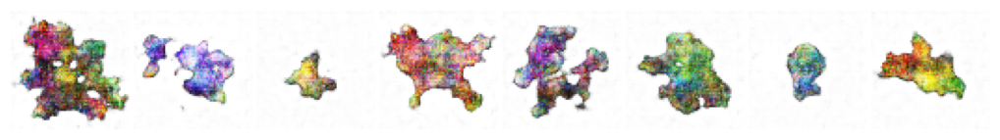

In [64]:
display_generator_samples(generator)

MovieWriter ffmpeg unavailable; using Pillow instead.


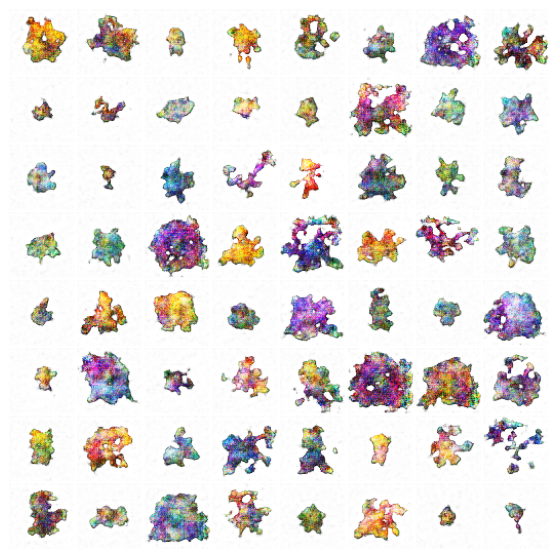

In [66]:
# see what images were generated over time
figure = plt.figure(figsize=(10, 10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated=True)] for i in image_progess]
anim = animation.ArtistAnimation(figure, ims, interval=100, repeat_delay=1000, blit=True)
anim.save('./animations/1000.gif')
HTML(anim.to_jshtml())



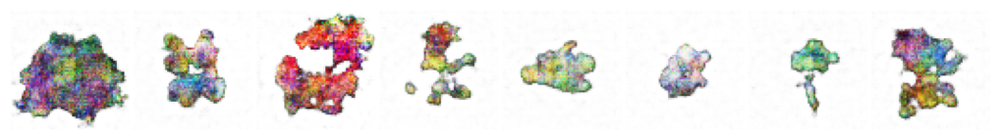

In [69]:
# load previous models and compare
loaded_gen = Generator().to(device)
loaded_gen.load_state_dict(torch.load('./models/lowLR1000G.pt'))
display_generator_samples(loaded_gen)

## Styling

In [519]:
TensorToImage = transforms.ToPILImage(mode='RGBA')

# Outline all the edges in img
def outline_edges(img):
    edges = img.convert('RGBA')
    # TODO: Outline edges pixel-by-pixel
    return edges

# Get a stylized sampling of a generator
def display_styled_generator_sample(generator):
    img_list = []
    plt.figure(figsize=(18, 10))
    plt.axis("off")
    noise = torch.randn(1, z_size, 1, 1, device=device)
    with torch.no_grad():
        gen = generator(noise).detach().cpu()
        img = (vutils.make_grid(gen, padding=2, normalize=True))
        # convert to PIL image
        img = TensorToImage(img)
        img = img.filter(ImageFilter.SMOOTH_MORE)
        img.paste(img)
        # increase sat + reduce color channels
        img = img.quantize(64)
        img = img.convert('RGBA')
        img = ImageEnhance.Color(img).enhance(2)
        # outline edges
        edges = outline_edges(img)
        img.paste(edges)
        img_list += [img]
    imgs = [plt.imshow(i) for i in img_list]
    plt.show()

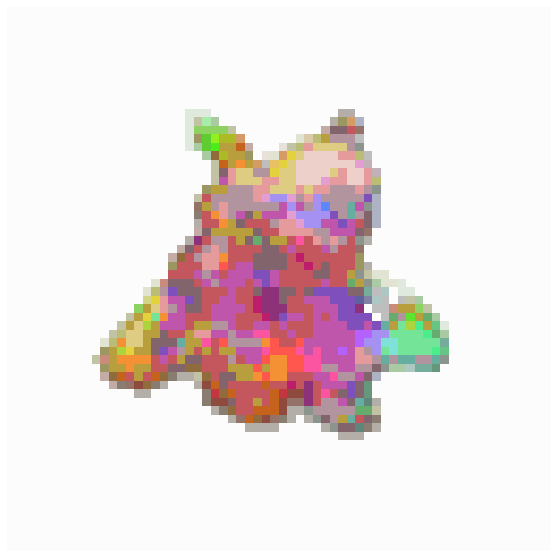

In [530]:
display_styled_generator_sample(loaded_gen)